In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [5]:
import numpy as np

from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [10, 5]
mpl.rcParams['figure.dpi'] = 300

from tqdne.conf import Config
dataset_path = Config().datasetdir / Path('GM0-dataset-split/data_train.h5')
dataset_path

PosixPath('/store/sdsc/sd28/data/GM0-dataset-split/data_train.h5')

In [3]:
n_tot = 1024 * (128 + 64)
n_tot

196608

In [ ]:
#with h5py.File(dataset_path, 'r') as f:
#    print(f['waveform'].shape)


In [6]:
import h5py

def load_waveforms_from_h5_dataset(file_path, n_samples=100000):
    with h5py.File(file_path, 'r') as f:
        waveforms = f['waveform']
        n_tot_samples = waveforms.shape[0]
        if n_samples > n_tot_samples:
            n_samples = n_tot_samples
        samples_indexes = np.random.choice(n_tot_samples, n_samples, replace=False)
        waveforms = waveforms[np.sort(samples_indexes)]
    return waveforms    

waveforms = load_waveforms_from_h5_dataset(dataset_path)
waveforms.shape

(100000, 3, 5501)

In [10]:
waveforms = np.transpose(waveforms, (1, 2, 0))
waveforms.shape

(3, 5501, 100000)

In [11]:
def plot_envelope(signal, title, envelope_function, **envelope_params):
    envelope = envelope_function(signal, **envelope_params)
    #print(np.where(envelope == 0))

    fig = plt.figure()
    
    ax1 = fig.add_subplot(211)
    ax1.plot(signal, alpha=0.6, label='signal')
    ax1.plot(envelope, linewidth=1,  label='envelope')
    ax1.set_title(title)
    ax1.legend()

    ax2 = fig.add_subplot(212)
    sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small. 
    argmin_sig_env = np.argmin(sig_scaledbyenvelope)

    ax2.plot(sig_scaledbyenvelope)
    #ax2.axvline(x=argmin_sig_env, color='r', linestyle='--')
    ax2.set_title("Signal scaled by its envelope")
    
    plt.tight_layout()
    plt.show()

    return envelope, sig_scaledbyenvelope, argmin_sig_env

# Trying Different Envelopes 

In [12]:
def envelope_first_order_lp(signal, k_env):
    envelope = signal.copy()
    #signal = np.abs(signal)
    for i in range(1, len(signal)):
        if signal[i] > signal[i-1] and signal[i] > envelope[i-1]:
            envelope[i] = signal[i]
        else:
            envelope[i] = k_env*envelope[i-1] + (1-k_env)*signal[i] # first order discrete time low pass filter
    return envelope

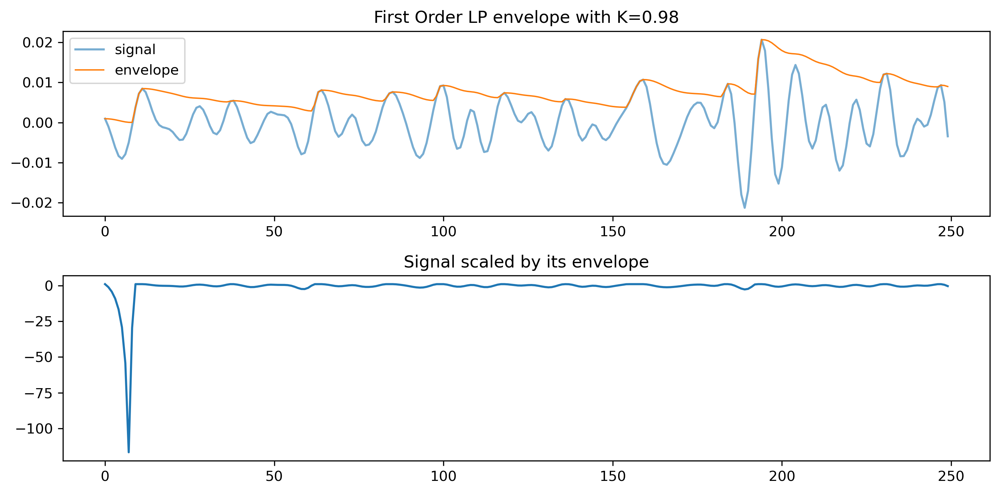

In [13]:
sample_idx = 3
env_params = {'k_env': 0.98}
k_env = env_params['k_env']
env, sig_scaledbyenv, argmin_sig_env = plot_envelope(np.nan_to_num(waveforms[0, 600:850, sample_idx], nan=0), title=f'First Order LP envelope with K={k_env}', envelope_function=envelope_first_order_lp, **env_params)

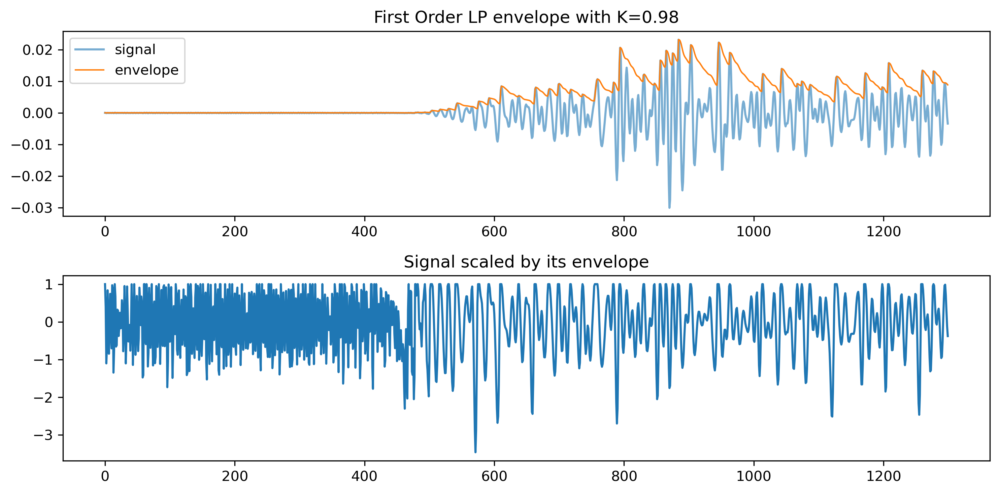

In [14]:
env, sig_scaledbyenv, argmin_sig_env = plot_envelope(np.nan_to_num(waveforms[0, :1300, sample_idx], nan=0), title=f'First Order LP envelope with K={k_env}', envelope_function=envelope_first_order_lp, **env_params)

In [15]:
sig_scaledbyenv[argmin_sig_env], waveforms[0, argmin_sig_env, sample_idx], env[argmin_sig_env], waveforms[0, argmin_sig_env, sample_idx]/env[argmin_sig_env]

(-3.4599643, -0.0054143253, 0.0015648501, -3.4599643)

Meaningless envelope. 

In [16]:
def envelope_third_order_lp(signal, k_env1, k_env2, k_env3):
    envelope = np.zeros(len(signal))
    for i in range(3, len(signal)-1):
        if signal[i] > signal[i-1]:
            envelope[i] = signal[i]
        else:
            envelope[i] = k_env1*envelope[i-1] + k_env2*envelope[i-2] + k_env3*envelope[i-3] + (1-k_env1)*signal[i] # first order discrete time low pass filter
    return envelope

/tmp/ipykernel_25128/2914301532.py:14: RuntimeWarning: divide by zero encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


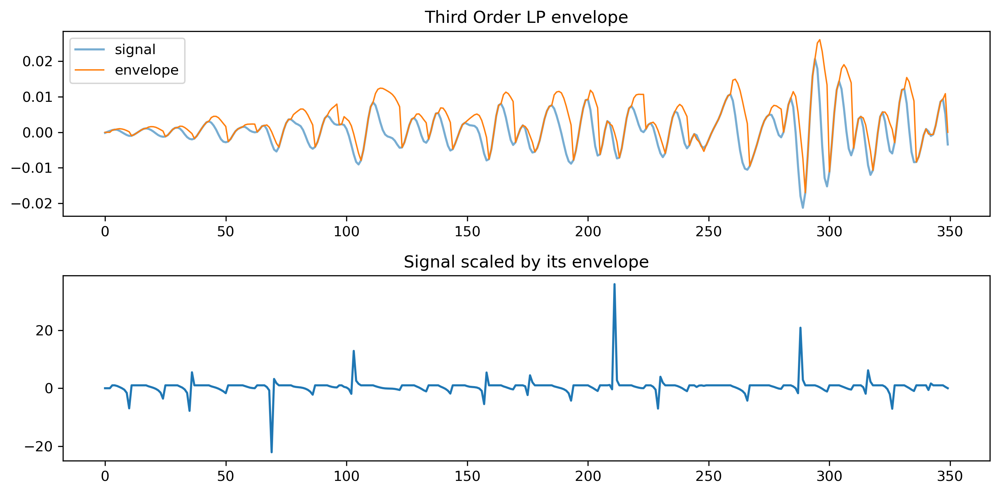

(array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  6.10169722e-04,
         7.50955485e-04,  9.11925209e-04,  1.01057358e-03,  9.31999887e-04,
         7.55365883e-04,  4.75667083e-04,  1.45580298e-04, -9.73895425e-04,
        -6.75412477e-04, -2.53920967e-04,  1.93457468e-04,  6.32449053e-04,
         9.83114354e-04,  1.10580365e-03,  1.46277681e-03,  1.59320162e-03,
         1.57100558e-03,  1.41185642e-03,  1.10654987e-03,  7.33557953e-04,
         3.50883007e-04, -1.20047398e-03, -7.88614387e-04, -1.67143889e-06,
         7.85209471e-04,  1.23485608e-03,  1.33170723e-03,  1.71870494e-03,
         1.68189642e-03,  1.33894455e-03,  8.35261568e-04,  2.35642424e-04,
        -3.64038698e-04, -1.76895107e-03, -1.04002585e-03,  1.51599602e-06,
         1.04564242e-03,  2.00919458e-03,  2.80423556e-03,  3.08965496e-03,
         4.14760457e-03,  4.50360114e-03,  4.48811005e-03,  4.09537866e-03,
         3.32323831e-03,  2.46615145e-03,  1.64298663e-03, -2.60979705e-03,
        -1.9

In [17]:
sample_idx = 3
env_params = {'k_env1': 0.5, 'k_env2': 0.3, 'k_env3': 0.2}
plot_envelope(waveforms[0, 500:850, sample_idx], title='Third Order LP envelope', envelope_function=envelope_third_order_lp, **env_params)

Meaningless envelope still. 

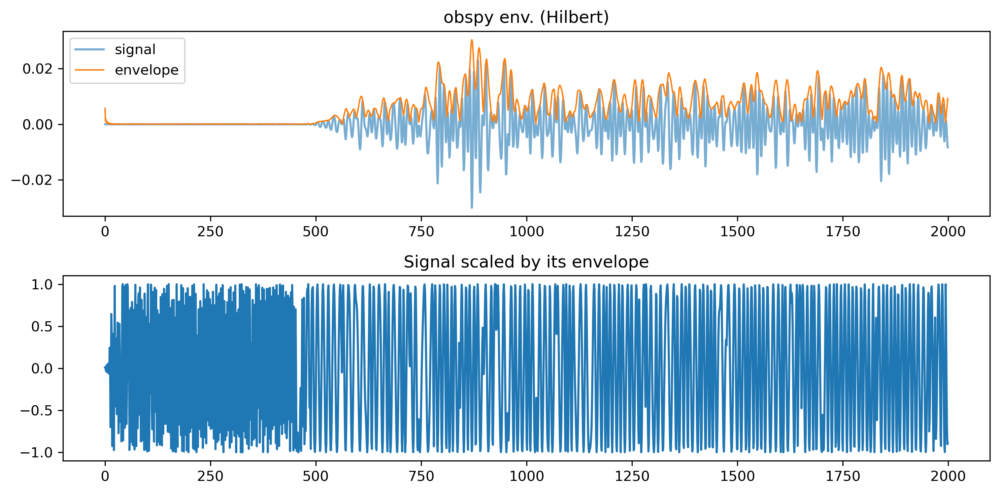

False


In [18]:
import obspy.signal.filter

sample_idx = 3
plot_envelope(waveforms[0, :2000, sample_idx], title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

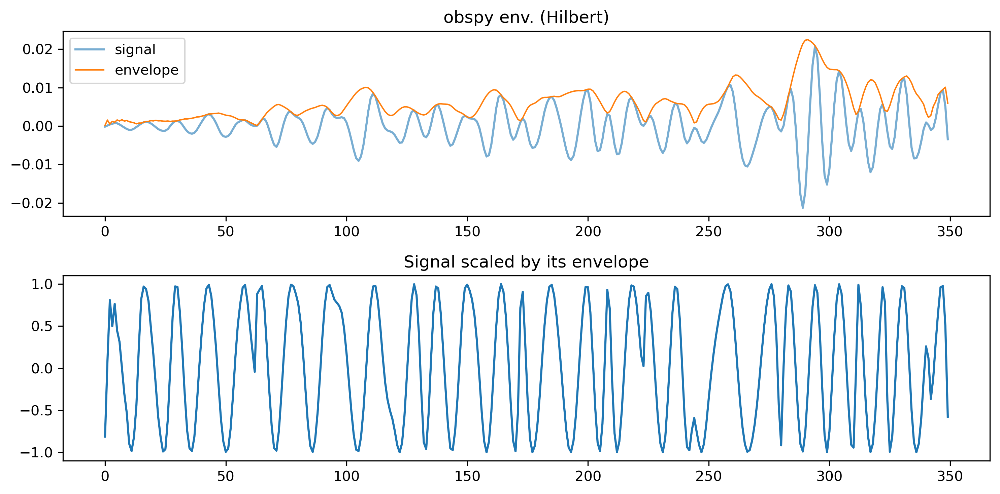

False


In [19]:
plot_envelope(waveforms[0, 500:850, sample_idx], title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

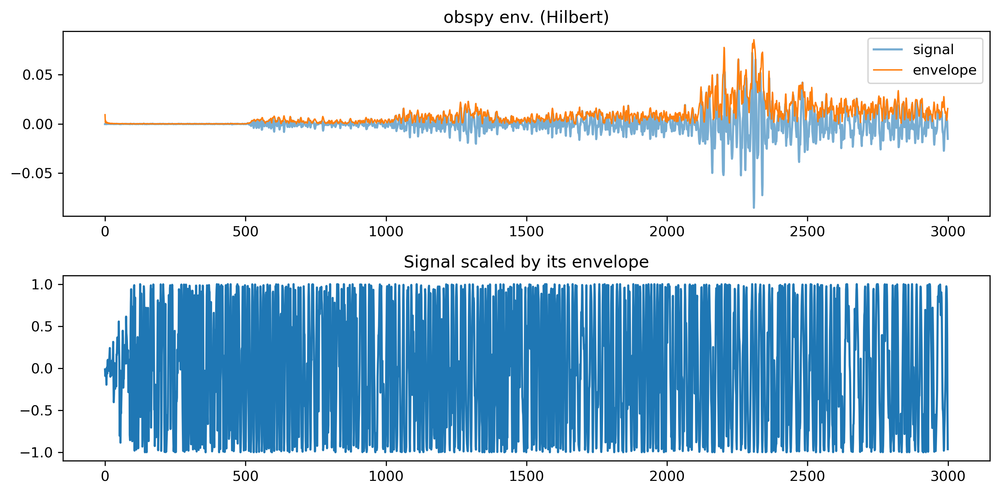

False


In [20]:
sample_idx = 0
plot_envelope(waveforms[0, :3000, sample_idx], title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

In [25]:
def _centered_window(x, window_len):
    assert window_len % 2, 'Centered Window has to have odd length'
    mid = window_len // 2
    pos = 0
    while pos < len(x):
        yield x[max(pos - mid, 0): min(pos + mid + 1, len(x))]
        pos += 1

def centered_max(x, window_len):
    out = [window.max() for window in _centered_window(x, window_len)]
    return np.array(out)

/tmp/ipykernel_25128/2914301532.py:14: RuntimeWarning: invalid value encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


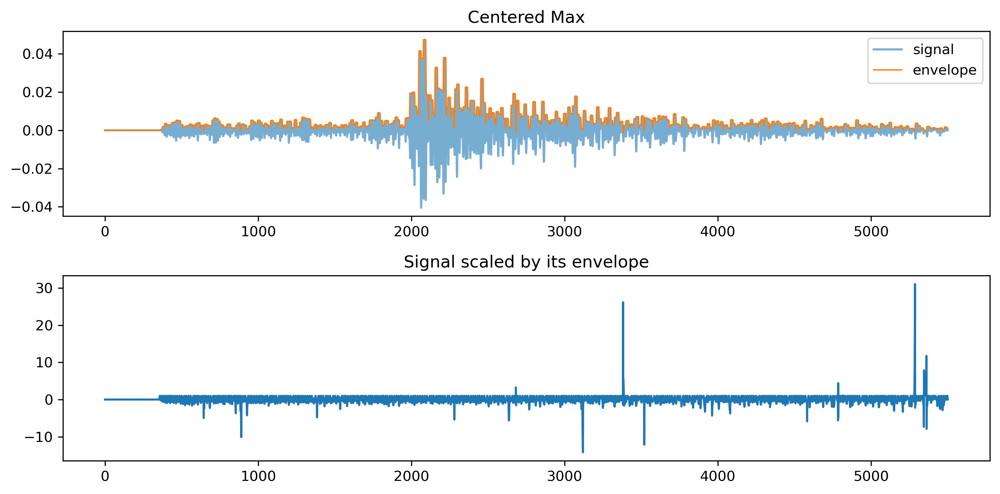

(array([0.        , 0.        , 0.        , ..., 0.00112288, 0.00112288,
        0.00112288], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.74009746, 0.34797537,
        0.0041126 ], dtype=float32),
 3119)

In [26]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=15)

/tmp/ipykernel_25128/2914301532.py:14: RuntimeWarning: invalid value encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


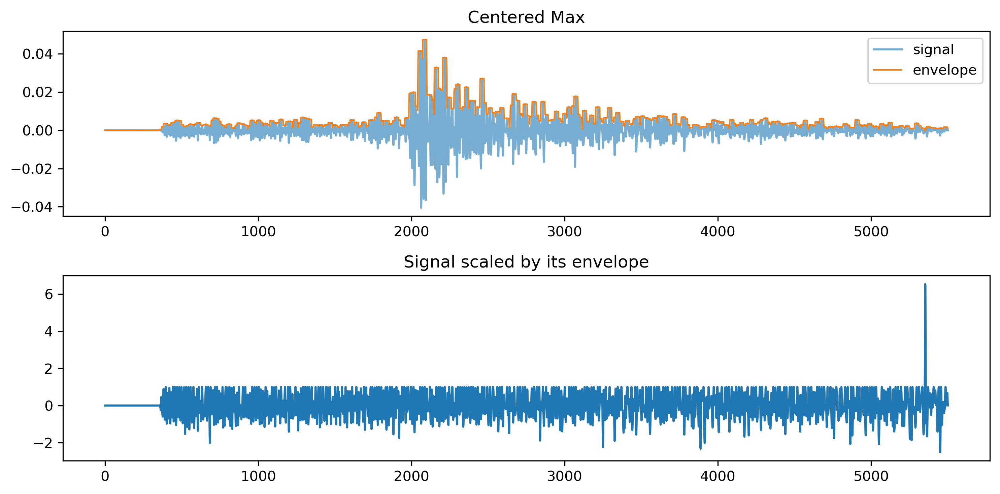

(array([0.        , 0.        , 0.        , ..., 0.0016025 , 0.00130193,
        0.00112288], dtype=float32),
 array([0.       , 0.       , 0.       , ..., 0.518592 , 0.30012  ,
        0.0041126], dtype=float32),
 5450)

In [27]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=25)

/tmp/ipykernel_25128/2914301532.py:14: RuntimeWarning: invalid value encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


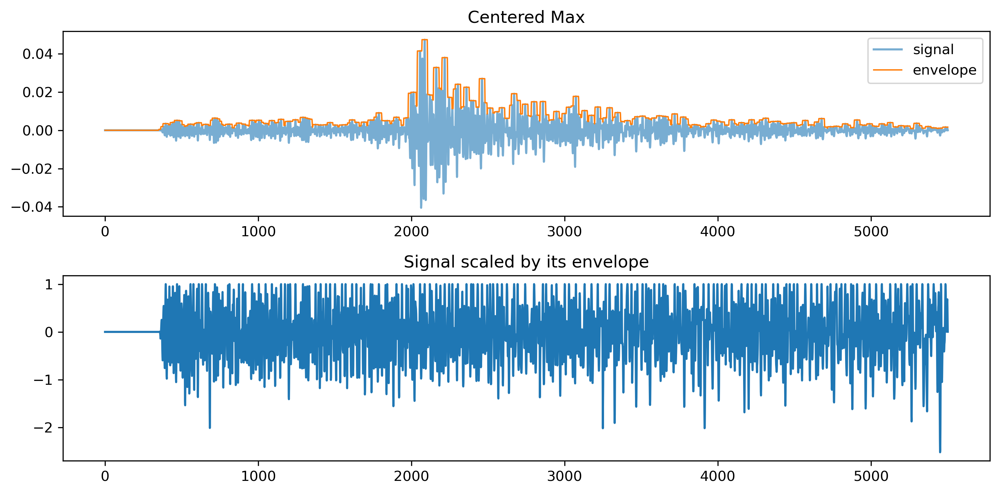

(array([0.        , 0.        , 0.        , ..., 0.00164545, 0.00164545,
        0.00164545], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.50505453, 0.23746404,
        0.0028065 ], dtype=float32),
 5450)

In [28]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=35)

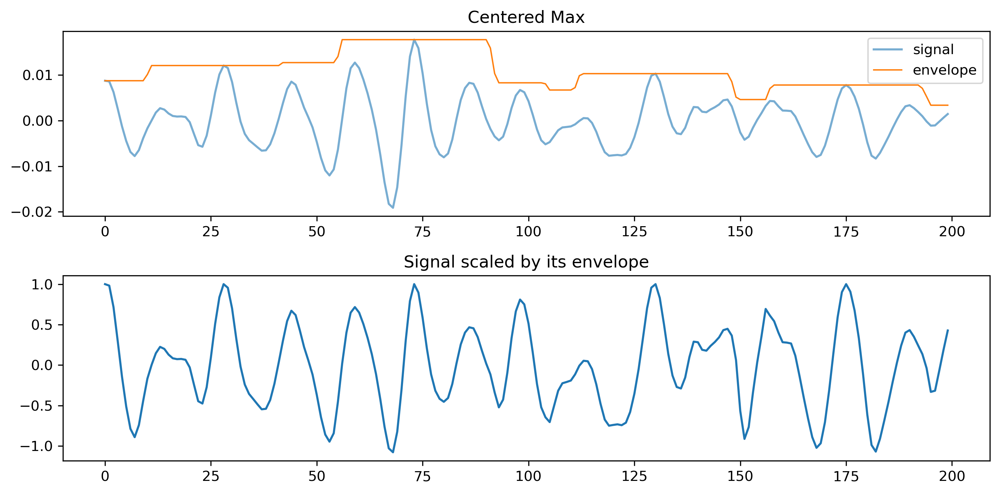

(array([0.00872683, 0.00872683, 0.00872683, 0.00872683, 0.00872683,
        0.00872683, 0.00872683, 0.00872683, 0.00872683, 0.00872683,
        0.01009485, 0.01205362, 0.01205362, 0.01205362, 0.01205362,
        0.01205362, 0.01205362, 0.01205362, 0.01205362, 0.01205362,
        0.01205362, 0.01205362, 0.01205362, 0.01205362, 0.01205362,
        0.01205362, 0.01205362, 0.01205362, 0.01205362, 0.01205362,
        0.01205362, 0.01205362, 0.01205362, 0.01205362, 0.01205362,
        0.01205362, 0.01205362, 0.01205362, 0.01205362, 0.01205362,
        0.01205362, 0.01205362, 0.01269588, 0.01269588, 0.01269588,
        0.01269588, 0.01269588, 0.01269588, 0.01269588, 0.01269588,
        0.01269588, 0.01269588, 0.01269588, 0.01269588, 0.01269588,
        0.01403394, 0.01772257, 0.01772257, 0.01772257, 0.01772257,
        0.01772257, 0.01772257, 0.01772257, 0.01772257, 0.01772257,
        0.01772257, 0.01772257, 0.01772257, 0.01772257, 0.01772257,
        0.01772257, 0.01772257, 0.01772257, 0.01

In [29]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, 3000:3200, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=35)

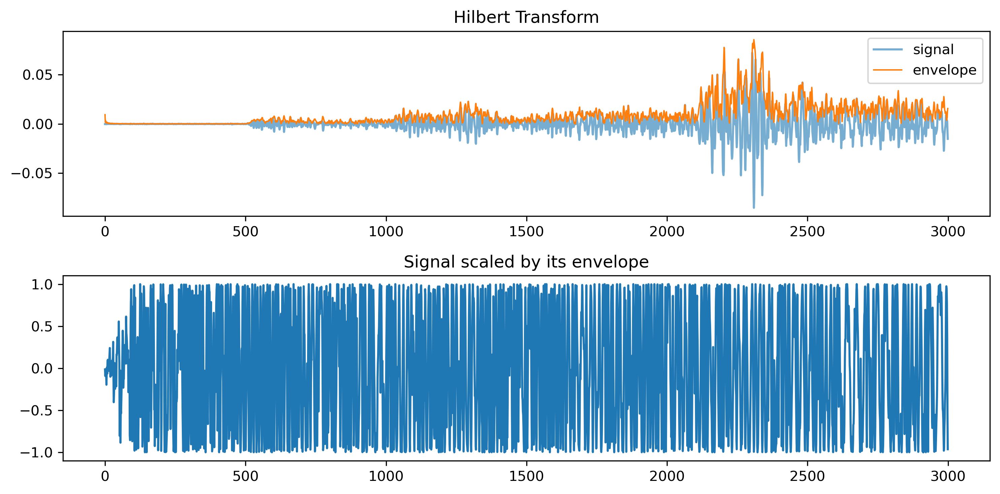

In [30]:
from scipy.signal import hilbert


sample_idx = 0
waveform = np.nan_to_num(waveforms[0, :3000, sample_idx], nan=0) # since it seems that the NaNs are at the edges of the signal, we can just replace them with 0
env, sig_scaled, _ = plot_envelope(waveform, title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

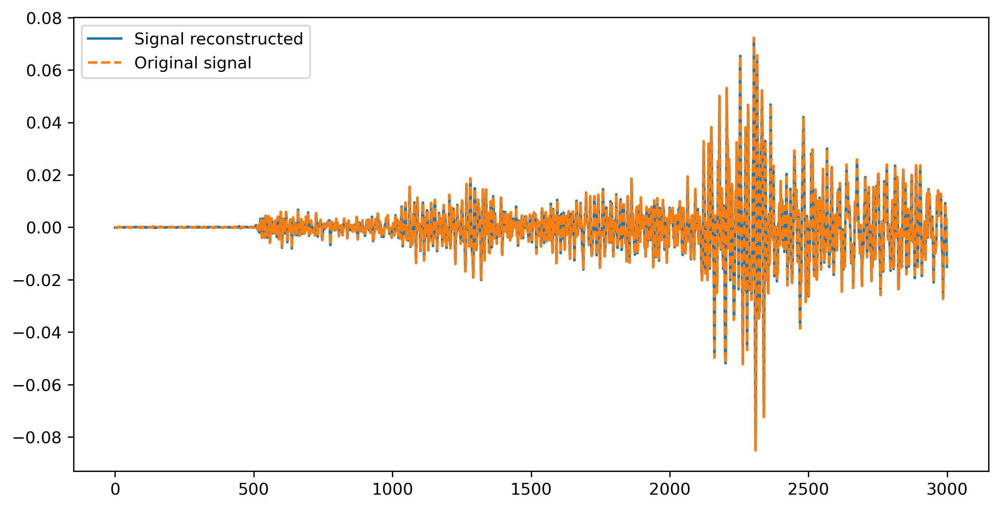

In [31]:
plt.plot(env*sig_scaled, label='Signal reconstructed')
plt.plot(waveform, '--', label='Original signal')
plt.legend()

# Envelope Statistics
Computing the mean and the standard deviation for the envelopes of the training dataset. Trying differents transformation to map envelopes in a small value range (even after normalization).

In [32]:
argmax_flat = np.nanargmax(waveforms)
argmax = np.unravel_index(argmax_flat, waveforms.shape)
np.nanmax(waveforms), argmax_flat, argmax

(16.92453, 1287225573, (2, 1870, 25573))

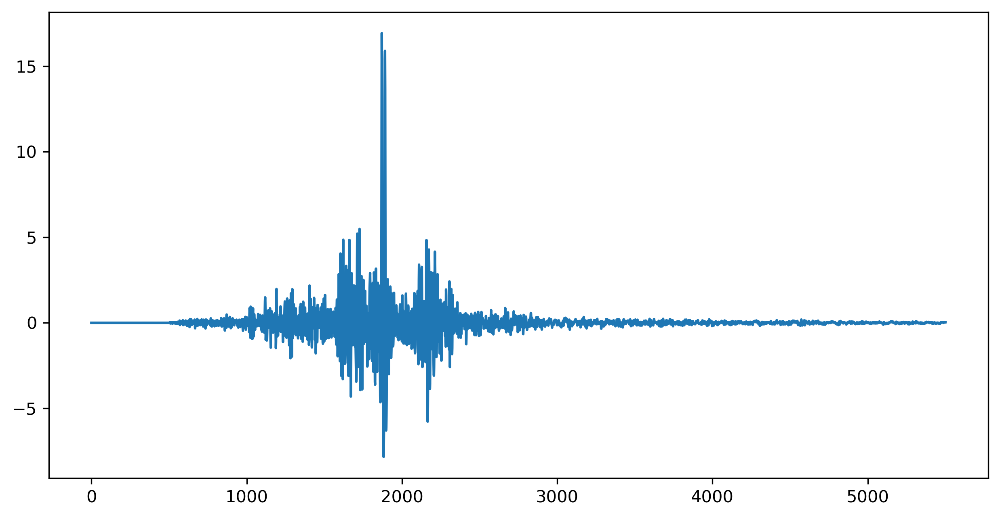

In [33]:
plt.plot(waveforms[argmax[0], :, argmax[-1]])

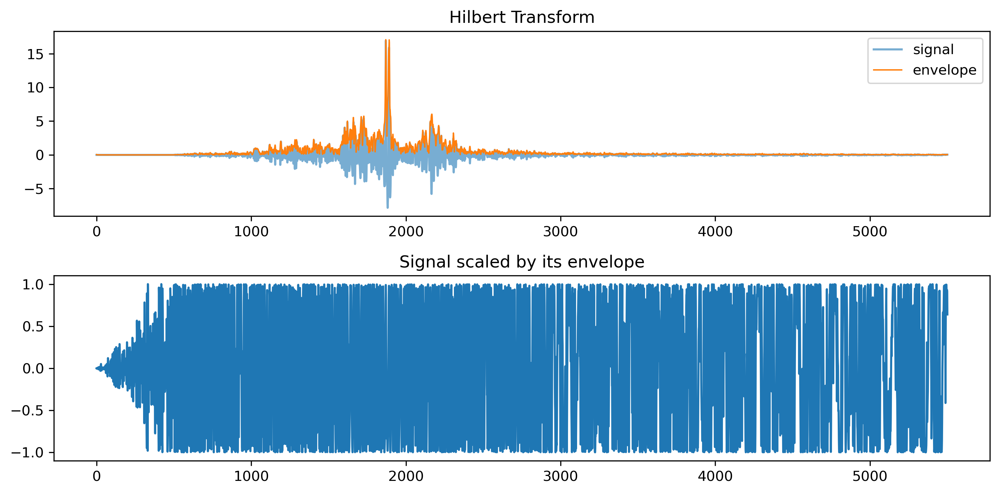

(array([0.046529  , 0.02382425, 0.02468431, ..., 0.03174468, 0.04183016,
        0.05916047], dtype=float32),
 array([-7.0543465e-04,  5.2179239e-04,  1.4420914e-03, ...,
         9.3218946e-01,  9.1636974e-01,  6.4062095e-01], dtype=float32),
 1705)

In [34]:
from scipy.signal import hilbert
plot_envelope(waveforms[argmax[0], :, argmax[-1]], title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

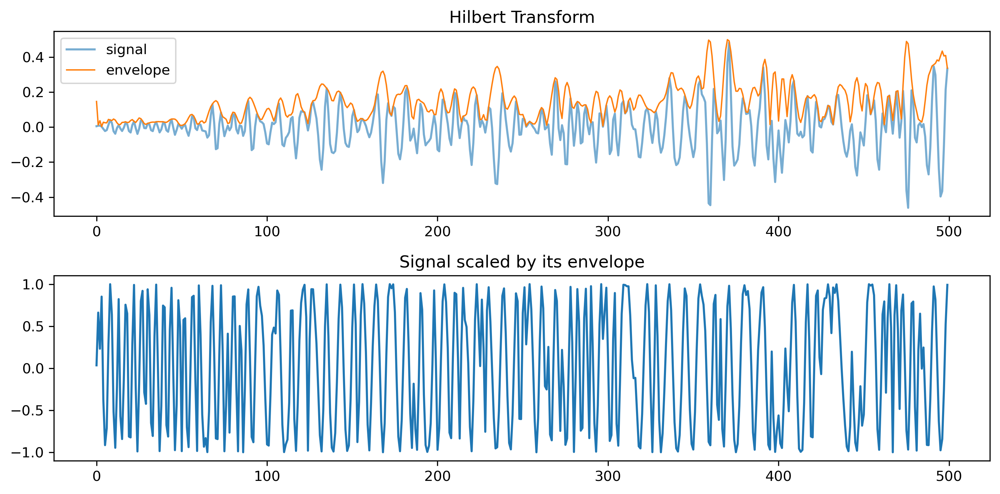

In [35]:
_,_,_ = plot_envelope(waveforms[argmax[0], 500:1000, argmax[-1]], title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

### Mean and Std of a subset of the dataset 

In [36]:
n = waveforms.shape[-1]
waveforms = np.nan_to_num(waveforms, nan=0)

mean = np.mean(waveforms, axis=2)
std_dev = np.std(waveforms, axis=2)
max = np.max(waveforms, axis=2)
min = np.min(waveforms, axis=2)

n, mean.shape, std_dev.shape, max.shape, min.shape

(100000, (3, 5501), (3, 5501), (3, 5501), (3, 5501))

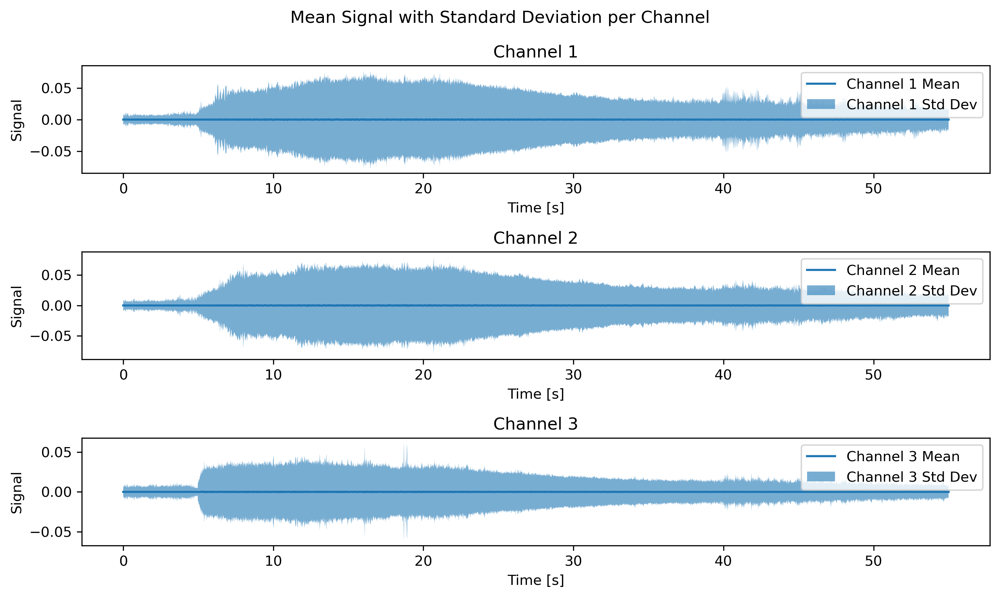

In [37]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Signal with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, mean[i] - std_dev[i], mean[i] + std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    #axs[i].plot(time_axis, max[i], label=f'Channel {i+1} Max')
    #axs[i].plot(time_axis, min[i], label=f'Channel {i+1} Min')
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [38]:
signal_statistics = {}

for i in range(mean.shape[0]):
    signal_statistics[f'ch{i+1}'] = {'mean': mean[i], 'std_dev': std_dev[i], 'max': max[i], 'min': min[i]}

signal_statistics['ch1']['mean'].shape, signal_statistics['ch1']['std_dev'].shape, signal_statistics['ch1']['max'].shape, signal_statistics['ch1']['min'].shape

((5501,), (5501,), (5501,), (5501,))

In [39]:
import pickle

with open('signal_statistics.pkl', 'wb') as f:
    pickle.dump(signal_statistics, f)

In [40]:
!ls

envelope.ipynb	  generate_samples.ipynb       test_dataset.ipynb
evaluation.ipynb  random_data_generator.ipynb  test_diffusion.ipynb
filter.ipynb	  signal_statistics.pkl        trans_env_statistics.pkl


## Mean and Std of the envelope of the signals

### Hilbert transform

In [41]:
envelopes = np.abs(hilbert(waveforms))
envelopes.shape

(3, 5501, 100000)

In [42]:
env_mean = np.mean(envelopes, axis=2)
env_std_dev = np.std(envelopes, axis=2)

n, env_mean.shape, env_std_dev.shape

(100000, (3, 5501), (3, 5501))

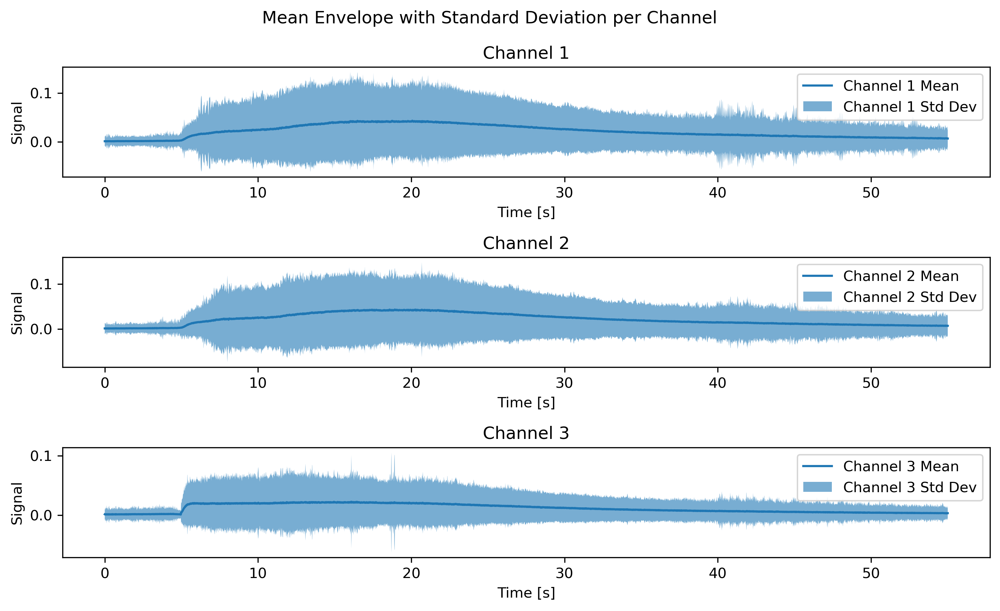

In [43]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Envelope with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , env_mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, env_mean[i] - env_std_dev[i], env_mean[i] + env_std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

#### Envelope Transformation

The following is to show what happen if we normalize the envelope of the maximum signal with the envelope mean and standard deviation.

In [44]:
max_signal = waveforms[argmax[0], :, argmax[-1]]
scaled_env_max_signal = ((np.abs(hilbert(max_signal)) - env_mean[argmax[0]])/env_std_dev[argmax[0]])
scaled_env_max_signal.shape

(5501,)

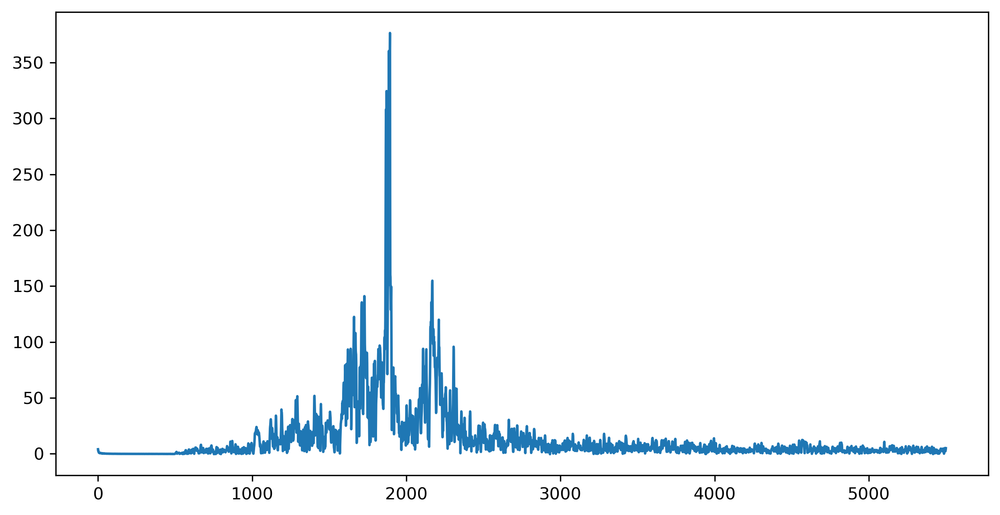

In [45]:
plt.plot(scaled_env_max_signal)

and to the envelope of a random signal. 

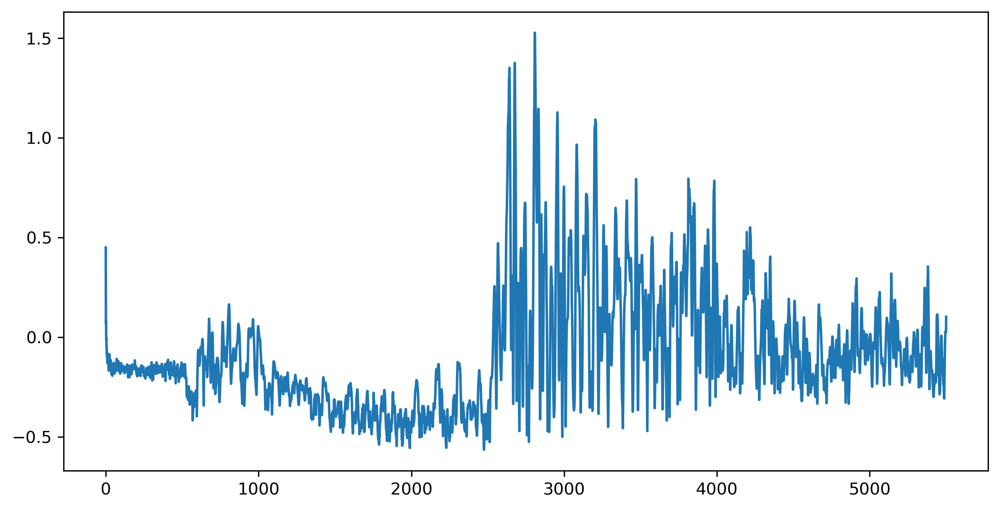

In [48]:
random_signal = waveforms[0, :, 25]
scaled_env_random_signal = ((np.abs(hilbert(random_signal)) - env_mean[0])/env_std_dev[0])
plt.plot(scaled_env_random_signal)

Appling a log tranform:

In [56]:
def log_transform(x, offset=1e-5):
    return np.log10(offset + x)

to the envelope of the maximum signal

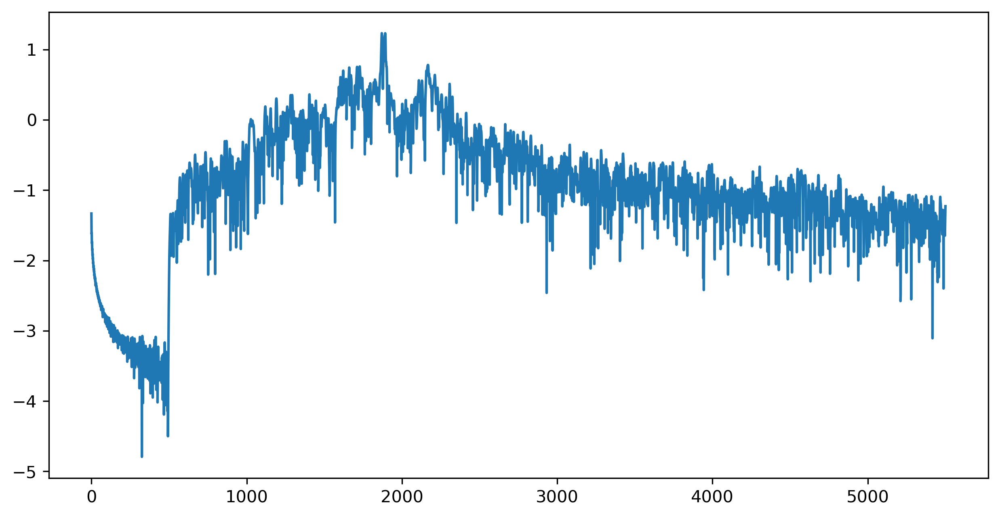

In [61]:
plt.plot(log_transform(
    (np.abs(hilbert(max_signal))), offset=1e-5)
    )

and to the envelope of the random signal 

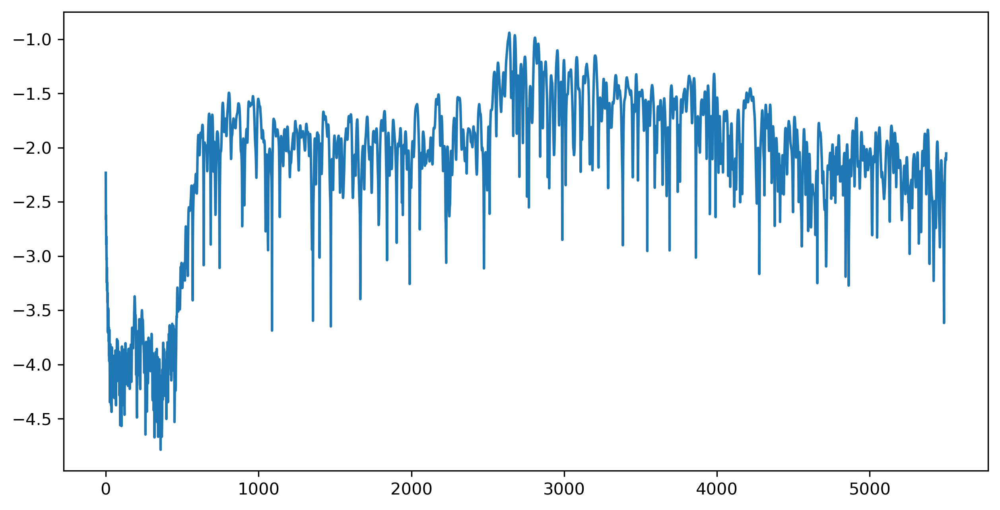

In [62]:
plt.plot(log_transform(np.abs(hilbert(random_signal))))

Range of values is now smaller. 

Let's compute the statistics of this transformed envelopes. 

In [63]:
transformed_envelopes = log_transform(envelopes)
envelopes.shape, transformed_envelopes.shape

((3, 5501, 100000), (3, 5501, 100000))

In [64]:
trans_env_mean = np.mean(transformed_envelopes, axis=2)
trans_env_std_dev = np.std(transformed_envelopes, axis=2)
trans_env_max = np.max(transformed_envelopes, axis=2)
trans_env_min = np.min(transformed_envelopes, axis=2)

n, trans_env_mean.shape, trans_env_std_dev.shape, trans_env_max.shape, trans_env_min.shape

(100000, (3, 5501), (3, 5501), (3, 5501), (3, 5501))

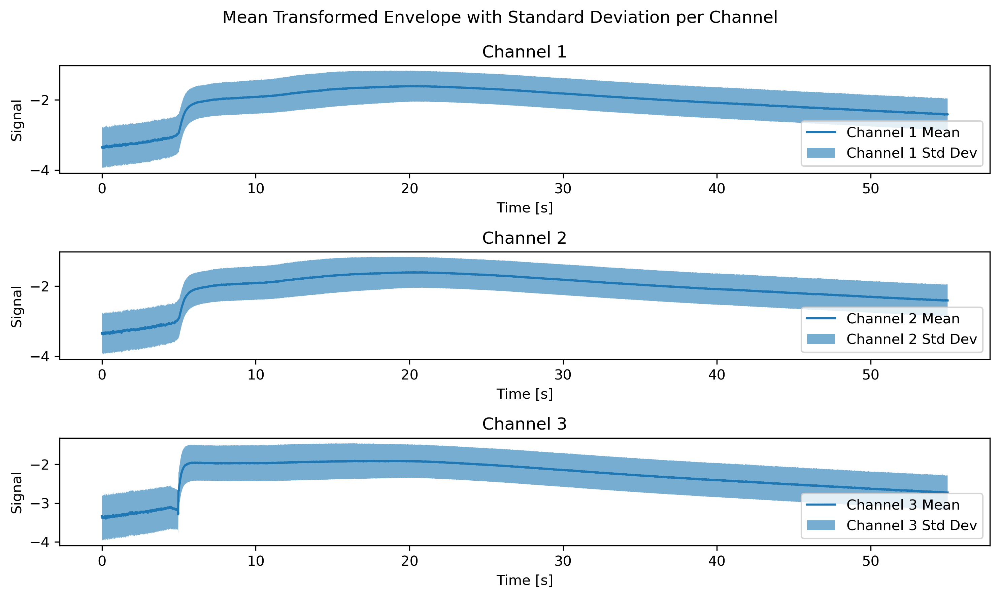

In [65]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Transformed Envelope with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , trans_env_mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, trans_env_mean[i] - trans_env_std_dev[i], trans_env_mean[i] + trans_env_std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [66]:
scaled_trans_env_max_signal = (log_transform(np.abs(hilbert(max_signal))) - trans_env_mean[argmax[0]]) / trans_env_std_dev[argmax[0]]

scaled_trans_env_max_signal.shape

(5501,)

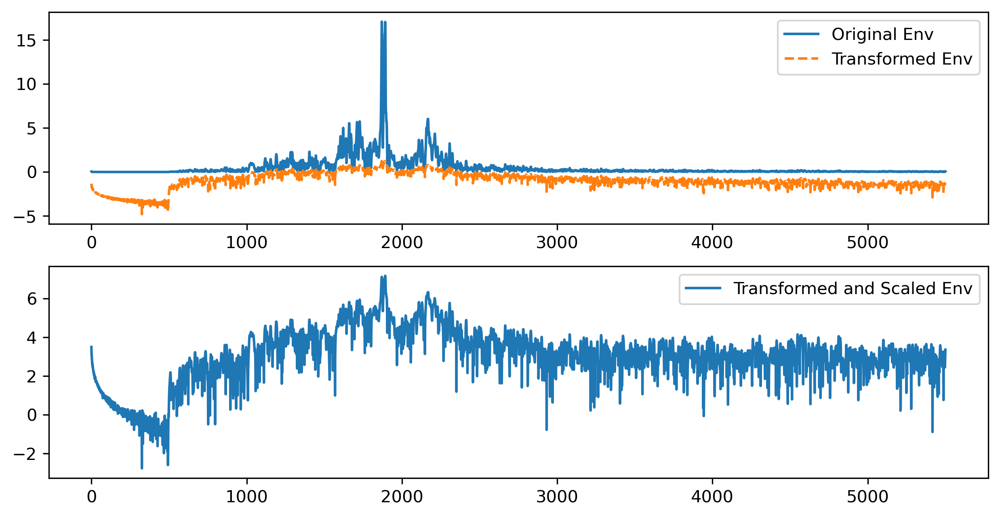

In [67]:
fig, axs = plt.subplots(2, 1)
axs[0].plot(np.abs(hilbert(max_signal)), label='Original Env')
axs[0].plot(log_transform(np.abs(hilbert(max_signal))), '--', label='Transformed Env')
axs[0].legend()
axs[1].plot(scaled_trans_env_max_signal, label='Transformed and Scaled Env')
axs[1].legend()

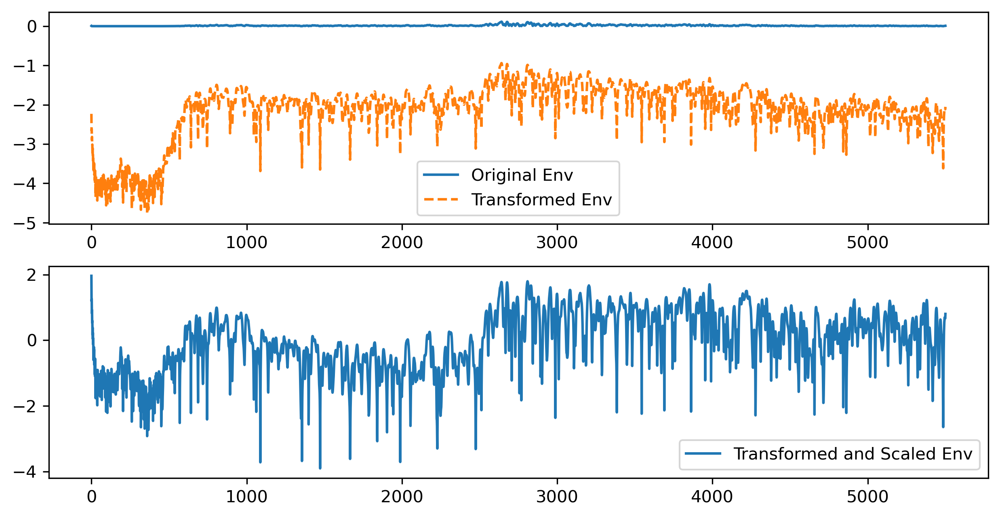

In [68]:
scaled_transf_env_random_signal = ((log_transform(np.abs(hilbert(random_signal))) - trans_env_mean[0]) / trans_env_std_dev[0])
fig, axs = plt.subplots(2, 1)
axs[0].plot(np.abs(hilbert(random_signal)), label='Original Env')
axs[0].plot(log_transform(np.abs(hilbert(random_signal))), '--', label='Transformed Env')
axs[0].legend()
axs[1].plot(scaled_transf_env_random_signal, label='Transformed and Scaled Env')
axs[1].legend()

With this transformation we are able to increase the variance of our dataset, and we can use it do standardize the dataset without expanding the range of signal values.

In [69]:
np.mean(trans_env_std_dev), np.std(trans_env_std_dev), np.min(trans_env_std_dev), np.max(trans_env_std_dev)

(0.46154082, 0.037922714, 0.42593133, 0.586479)

Here is shown how it's possible to reconstruct the transformed and scaled envelope

In [88]:
def inverse_log_transform(x, offset=1e-5):
    return 10**(x) - offset

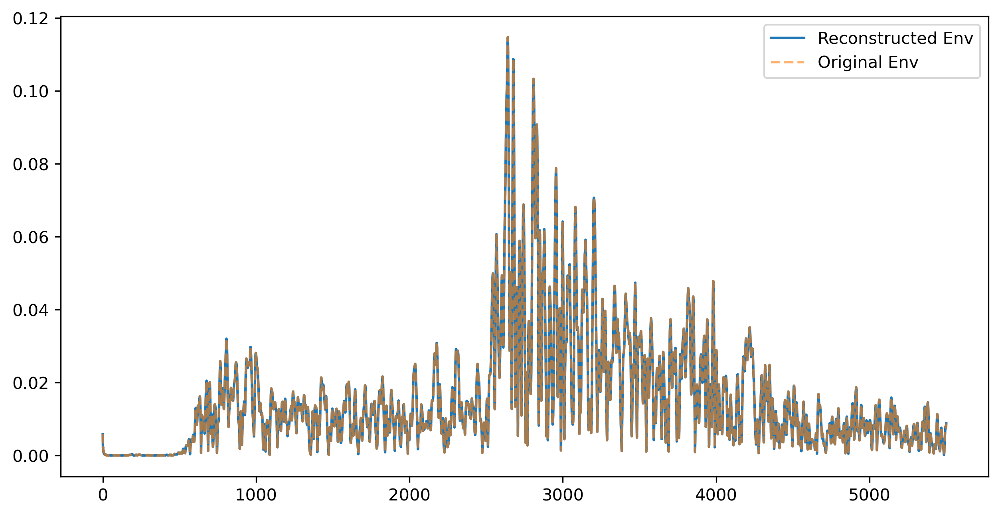

In [93]:
unscaled_trans_env_random_signal = scaled_transf_env_random_signal * trans_env_std_dev[0] + trans_env_mean[0]
plt.plot(inverse_log_transform(unscaled_trans_env_random_signal), label='Reconstructed Env')
plt.plot(np.abs(hilbert(random_signal)), '--', alpha=0.6, label='Original Env')

plt.legend()

Storing the transformed envelope statistics

In [98]:
trans_env_statistics = {}

for i in range(mean.shape[0]):
    trans_env_statistics[f'ch{i+1}'] = {'mean': trans_env_mean[i], 'std_dev': trans_env_std_dev[i], 'max': trans_env_max[i], 'min': trans_env_min[i]}

trans_env_statistics['trans_function'] = log_transform
trans_env_statistics['inv_trans_function'] = inverse_log_transform

trans_env_statistics['ch1']['mean'].shape, trans_env_statistics['ch1']['std_dev'].shape, trans_env_statistics['ch1']['max'].shape, trans_env_statistics['ch1']['min'].shape, trans_env_statistics['trans_function'], trans_env_statistics['inv_trans_function']

((5501,),
 (5501,),
 (5501,),
 (5501,),
 <function __main__.log_transform(x, offset=1e-05)>,
 <function __main__.inverse_log_transform(x, offset=1e-05)>)

In [95]:
with open('trans_env_statistics.pkl', 'wb') as f:
    pickle.dump(trans_env_statistics, f)

In [96]:
env_stats_per_channel = [trans_env_statistics[f'ch{i+1}'] for i in range(3)]
env_stats_per_channel

[{'mean': array([-3.3556278, -3.3442698, -3.3427937, ..., -2.410254 , -2.4155388,
         -2.4141095], dtype=float32),
  'std_dev': array([0.5725311 , 0.5754671 , 0.57116795, ..., 0.4527846 , 0.45319843,
         0.44977218], dtype=float32),
  'max': array([-0.0025    , -0.11146618,  0.09622252, ...,  0.12712876,
          0.02788219,  0.01404253], dtype=float32),
  'min': array([-4.9988036, -4.9992476, -4.999954 , ..., -4.990843 , -4.955543 ,
         -4.878461 ], dtype=float32)},
 {'mean': array([-3.3380897, -3.33752  , -3.3656468, ..., -2.403506 , -2.4068592,
         -2.40742  ], dtype=float32),
  'std_dev': array([0.5716748 , 0.57127404, 0.5740576 , ..., 0.45521992, 0.45722163,
         0.4560451 ], dtype=float32),
  'max': array([0.20530254, 0.26169467, 0.30592483, ..., 0.17209665, 0.12366477,
         0.15114142], dtype=float32),
  'min': array([-4.998977 , -4.9999485, -4.9979634, ..., -4.909507 , -4.8988905,
         -4.922369 ], dtype=float32)},
 {'mean': array([-3.3410509, -

In [97]:
np.array([env_stats_per_channel[i]['mean'] for i in range(3)]).shape

(3, 5501)